In [64]:
# 時系列分析
# dataset: covid19
# library

# dataset: "https://covid19.mhlw.go.jp/public/opendata/newly_confirmed_cases_daily.csv"
import datetime
import os
import matplotlib.pyplot as plt
from neuralprophet import NeuralProphet
from scipy.stats import norm
import statsmodels.api as sm
from statsmodels.tsa.seasonal import STL #STL分解
from statsmodels.tsa.seasonal import seasonal_decompose
import pandas as pd
import plotly.express as px
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [65]:
# dataset
# DATA_DIR="./data/mhlw"
# RAW_DATA = pd.read_csv(os.path.join(DATA_DIR, 'newly_confirmed_cases_daily.csv'), index_col="Date", parse_dates=True)
DATA_URL="https://covid19.mhlw.go.jp/public/opendata/newly_confirmed_cases_daily.csv"
RAW_DATA=pd.read_csv(DATA_URL, index_col=['Date'], parse_dates=True)

In [66]:
# DATA= RAW_DATA.query('Prefecture == "ALL"')  # 全国のデータ
RAW_DATA.isnull().sum()

Prefecture               0
Newly confirmed cases    0
dtype: int64

In [67]:
DATA = RAW_DATA

In [68]:
DATA.head()

,Prefecture,Newly confirmed cases
Date,,
2020-01-26,ALL,1
2020-01-26,Hokkaido,0
2020-01-26,Aomori,0
2020-01-26,Iwate,0
2020-01-26,Miyagi,0


In [69]:
# df_selected = df_selected.reset_index()
df = DATA.reset_index()

In [70]:
df = df.rename(columns={'Newly confirmed cases': 'NewCases'})

In [71]:
df.columns

Index(['Date', 'Prefecture', 'NewCases'], dtype='object')

In [72]:
df.head()

,Date,Prefecture,NewCases
0,2020-01-26,ALL,1
1,2020-01-26,Hokkaido,0
2,2020-01-26,Aomori,0
3,2020-01-26,Iwate,0
4,2020-01-26,Miyagi,0


In [73]:
# 新規感染者数のデイリーデータから全国の集計を除外
df_jp = df.query('Prefecture != "ALL"')

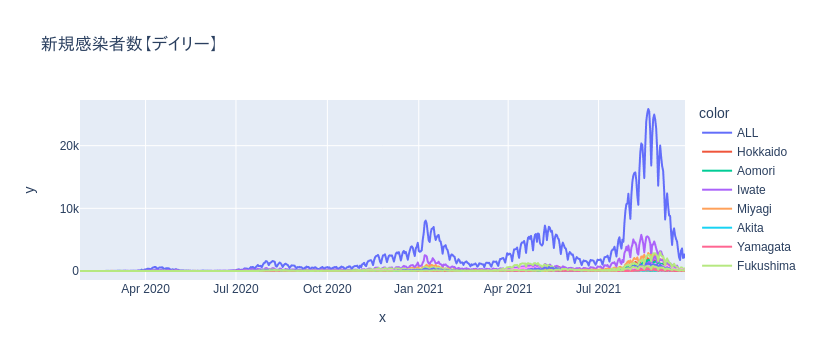

In [74]:
# plot（デイリーの観測データ）
px.line(x=df['Date'], y=df['NewCases'], color=df['Prefecture'], title="新規感染者数【デイリー】",
       width=800, height=300)

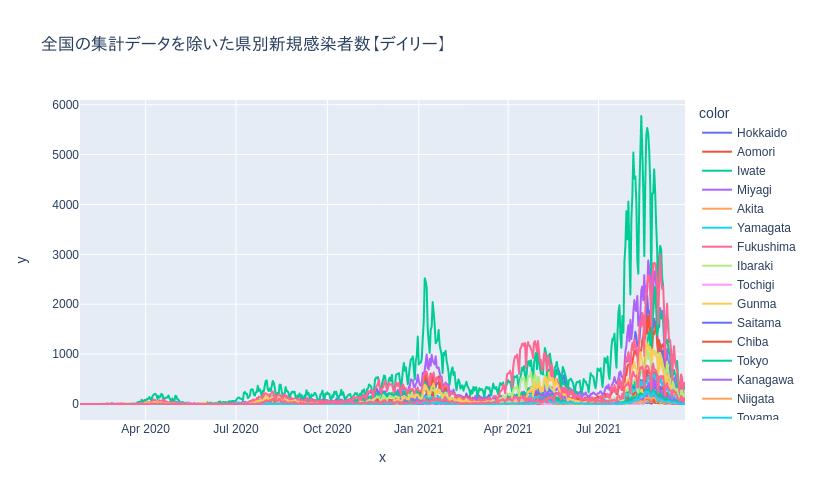

In [75]:
# plot
px.line(x=df_jp['Date'], y=df_jp['NewCases'], color=df_jp['Prefecture'], title="全国の集計データを除いた県別新規感染者数【デイリー】",
       width=1000, height=500)

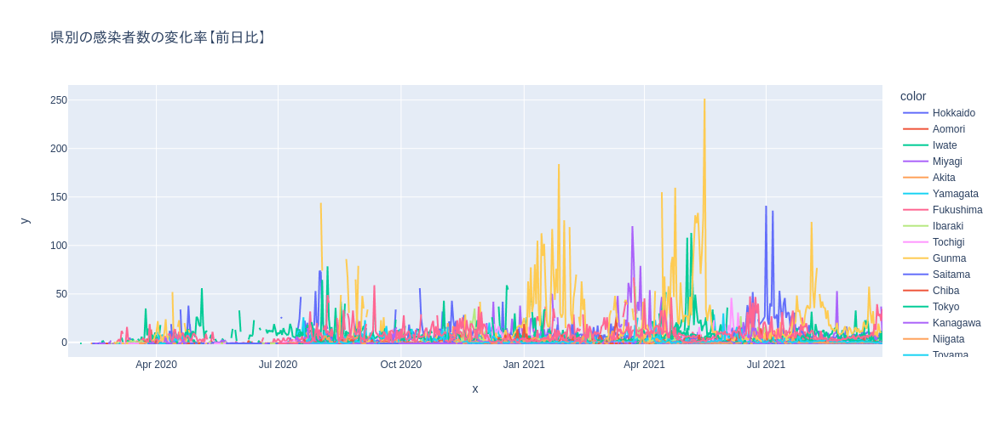

In [76]:
# plot
px.line(x=df_jp['Date'], y=df_jp['NewCases'].pct_change(), color=df_jp['Prefecture'], title="県別の感染者数の変化率【前日比】",
       width=800, height=500)

In [77]:
# 県別データをSTL分解
stl_jp= STL(df_jp['NewCases'], period=12, robust=True)

In [78]:
stl_series_jp= stl_jp.fit()

In [79]:
# STL分解結果のデータ
stl_jp_o = stl_series_jp.observed #観測データ（STL分解前の元のデータ）＝トレンド＋季節性＋残差
stl_jp_t = stl_series_jp.trend    #トレンド（trend）
stl_jp_s = stl_series_jp.seasonal #季節性（seasonal）
stl_jp_r = stl_series_jp.resid    #残差（resid）

In [80]:
"""
# STL分解
# 元データ = トレンド + 季節性 + 残渣
stl=STL(df['NewCases'], period=12, robust=True)
stl_series = stl.fit()

# STL分解結果のデータ
stl_o = stl_series.observed #観測データ（STL分解前の元のデータ）＝トレンド＋季節性＋残差
stl_t = stl_series.trend    #トレンド（trend）
stl_s = stl_series.seasonal #季節性（seasonal）
stl_r = stl_series.resid    #残差（resid）
"""

"\n# STL分解\n# 元データ = トレンド + 季節性 + 残渣\nstl=STL(df['NewCases'], period=12, robust=True)\nstl_series = stl.fit()\n\n# STL分解結果のデータ\nstl_o = stl_series.observed #観測データ（STL分解前の元のデータ）＝トレンド＋季節性＋残差\nstl_t = stl_series.trend    #トレンド（trend）\nstl_s = stl_series.seasonal #季節性（seasonal）\nstl_r = stl_series.resid    #残差（resid）\n"

In [81]:
# トレンドの中身
stl_series_jp.trend

1         0.006845
2         0.006574
3         0.006313
4         0.006069
5         0.005842
           ...    
29275    22.374734
29276    22.491562
29277    22.603121
29278    22.708070
29279    22.805933
Name: trend, Length: 28670, dtype: float64

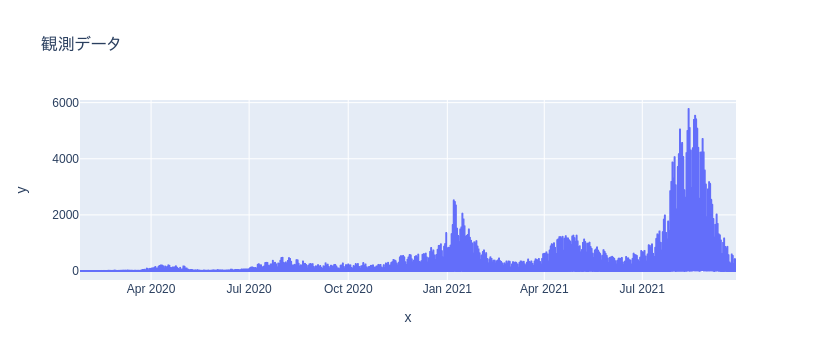

In [82]:
px.line(x=df_jp['Date'], y=stl_jp_o, title="観測データ")

In [83]:
# 4のサブプロットで構成されるfigを定義
fig= make_subplots(rows=4, cols=1, subplot_titles=("実測値", "トレンド", "季節成分", "残差"))

In [84]:
# subplot: 観測データ
fig.append_trace(go.Scatter(
    x=df_jp['Date'],
    y=stl_jp_o,
    name="rawdata"),
    row=1, col=1
)

In [85]:
# subplot: トレンド
fig.append_trace(go.Scatter(
    x=df_jp['Date'],
    y=stl_jp_t,
    name="trend"),
    row=2, col=1
)

In [86]:
# subplot: 季節成分
fig.append_trace(go.Scatter(
    x=df_jp['Date'],
    y=stl_jp_s,
    name="seasonal"),
    row=3, col=1
)

In [87]:
# subplot: 残差
fig.append_trace(go.Scatter(
    x=df_jp['Date'],
    y=stl_jp_r,
    name="residual"),
    row=4, col=1
)

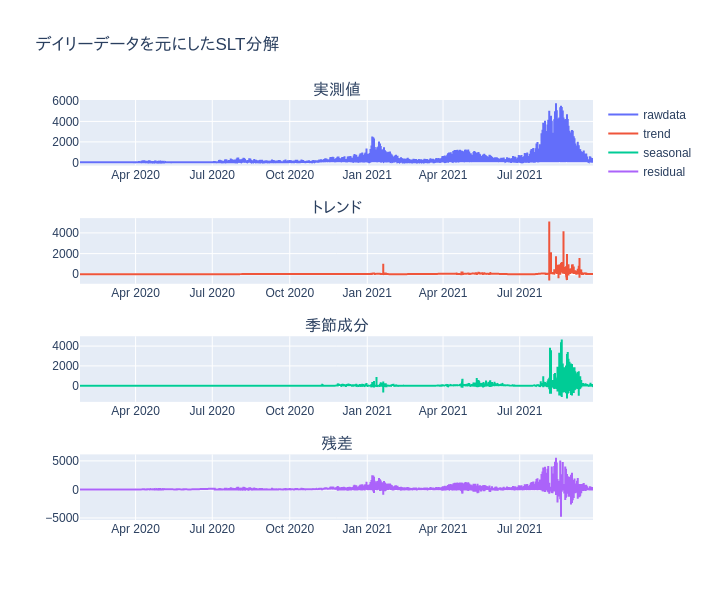

In [88]:
# plot
fig.update_layout(height=600, width=600, title_text="デイリーデータを元にしたSLT分解")
fig.show()

In [1]:
# import seaborn as sns
# sns.heatmap(RAW_DATA.corr())

In [ ]:
# result = mod.fit(disp=False)

In [ ]:
# サマリー
# print(result.summary())

In [29]:
# sm.graphics.tsa.plot_acf(df['NewCases'], lags=40)

In [30]:
# sm.graphics.tsa.plot_pacf(df['NewCases'], lags=40)

In [32]:
"""
# 自己相関係数と偏自己相関係数のコレログラムを出力
fig,ax = plt.subplots(2,1,figsize=(12,8))
fig = sm.graphics.tsa.plot_acf(df, lags=100, ax=ax[0], color="darkgoldenrod")
fig = sm.graphics.tsa.plot_pacf(df, lags=100, ax=ax[1], color="darkgoldenrod")
plt.show()
"""

'\n# 自己相関係数と偏自己相関係数のコレログラムを出力\nfig,ax = plt.subplots(2,1,figsize=(12,8))\nfig = sm.graphics.tsa.plot_acf(df, lags=100, ax=ax[0], color="darkgoldenrod")\nfig = sm.graphics.tsa.plot_pacf(df, lags=100, ax=ax[1], color="darkgoldenrod")\nplt.show()\n'

In [ ]:
# NewCasesの1次差分系列
# plt.rcParams['figure.figsize'] = 12, 8
# df.diff().plot(linewidth=4, color="mediumseagreen")

In [33]:
# df['NewCases']の変化率
# plt.rcParams['figure.figsize'] = 12, 8
# wau.diff().plot(linewidth=4, color="mediumseagreen")
# df['NewCases'].pct_change().plot(linewidth=4, color="steelblue")

In [34]:
"""
# 原系列に対するADF検定
results = sm.tsa.stattools.adfuller(df["NewCases"])
print('ADF Statistic: %f' % results[0])
print('P-Value: %f' % results[1])
"""

'\n# 原系列に対するADF検定\nresults = sm.tsa.stattools.adfuller(df["NewCases"])\nprint(\'ADF Statistic: %f\' % results[0])\nprint(\'P-Value: %f\' % results[1])\n'

In [35]:
"""
# トレンドと季節成分の抽出
# トレンド成分と季節成分, 残差を抽出する
fig, axes = plt.subplots(4, 1, sharex=True)

decomposition = sm.tsa.seasonal_decompose(df['NewCases'], model ='additive')
decomposition.observed.plot(ax=axes[0], legend=False, color='r')
axes[0].set_ylabel('Observed')
decomposition.trend.plot(ax=axes[1], legend=False, color='g')
axes[1].set_ylabel('Trend')
decomposition.seasonal.plot(ax=axes[2], legend=False)
axes[2].set_ylabel('Seasonal')
decomposition.resid.plot(ax=axes[3], legend=False, color='k')
axes[3].set_ylabel('Residual')
"""

"\n# トレンドと季節成分の抽出\n# トレンド成分と季節成分, 残差を抽出する\nfig, axes = plt.subplots(4, 1, sharex=True)\n\ndecomposition = sm.tsa.seasonal_decompose(df['NewCases'], model ='additive')\ndecomposition.observed.plot(ax=axes[0], legend=False, color='r')\naxes[0].set_ylabel('Observed')\ndecomposition.trend.plot(ax=axes[1], legend=False, color='g')\naxes[1].set_ylabel('Trend')\ndecomposition.seasonal.plot(ax=axes[2], legend=False)\naxes[2].set_ylabel('Seasonal')\ndecomposition.resid.plot(ax=axes[3], legend=False, color='k')\naxes[3].set_ylabel('Residual')\n"

In [54]:
DATA.reset_index()

,Date,Prefecture,Newly confirmed cases
0,2020-01-26,ALL,1
1,2020-01-26,Hokkaido,0
2,2020-01-26,Aomori,0
3,2020-01-26,Iwate,0
4,2020-01-26,Miyagi,0
...,...,...,...
29275,2021-09-26,Kumamoto,14
29276,2021-09-26,Oita,18
29277,2021-09-26,Miyazaki,5
29278,2021-09-26,Kagoshima,2
